In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/amexfeather/test_data_f32.ftr
/kaggle/input/amexfeather/train_data.ftr
/kaggle/input/amexfeather/train_data_f32.ftr
/kaggle/input/amexfeather/test_data.ftr
/kaggle/input/amex-default-prediction/sample_submission.csv
/kaggle/input/amex-default-prediction/train_data.csv
/kaggle/input/amex-default-prediction/test_data.csv
/kaggle/input/amex-default-prediction/train_labels.csv


In [2]:
!pip install pyforest

from pyforest import *

  Preparing metadata (setup.py) ... - \ | done
  Created wheel for pyforest: filename=pyforest-1.1.0-py2.py3-none-any.whl size=14606 sha256=ed6745e7c86fe36787a5f2e708d88d9d2020ef4ae52d46765a65c33ac63701d0
  Stored in directory: /root/.cache/pip/wheels/9e/7d/2c/5d2f5e62de376c386fd3bf5a8e5bd119ace6a9f48f49df6017
Successfully built pyforest


## Loading Data

The competition's dataset is notably large, causing issues with memory capacity when reading the original csv files. Consequently, I use the AMEX-Feather-Dataset from @munumbutt, which compresses the data.I found this datasets whiles combing through the competition looking for ways to minimize the size of the data. This Feather file converts the floating-point precision from 64 bit to 16 bit, enhancing memory efficiency. Additionally, the Feather file format, being binary, allows for quicker data loading compared to csv files.


In [3]:
train_data = pd.read_feather('../input/amexfeather/train_data.ftr')
test_data = pd.read_feather('../input/amexfeather/test_data.ftr')
train_data.head()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,...,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,target
0,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-03-09,0.938477,0.001734,0.008728,1.006836,0.009224,0.124023,0.008774,0.004707,...,NaN,NaN,0.002426,0.003706,0.003819,NaN,0.000569,0.000610,0.002674,0
1,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-04-07,0.936523,0.005775,0.004925,1.000977,0.006153,0.126709,0.000798,0.002714,...,NaN,NaN,0.003956,0.003166,0.005032,NaN,0.009575,0.005493,0.009216,0
2,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-05-28,0.954102,0.091492,0.021652,1.009766,0.006817,0.123962,0.007599,0.009422,...,NaN,NaN,0.003269,0.007328,0.000427,NaN,0.003429,0.006985,0.002604,0
3,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-06-13,0.960449,0.002455,0.013687,1.002930,0.001372,0.117188,0.000685,0.005531,...,NaN,NaN,0.006119,0.004517,0.003201,NaN,0.008423,0.006527,0.009598,0
4,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-07-16,0.947266,0.002483,0.015190,1.000977,0.007607,0.117310,0.004654,0.009308,...,NaN,NaN,0.003672,0.004944,0.008888,NaN,0.001670,0.008125,0.009827,0


In [4]:
train_data.shape

(5531451, 191)

As we can see the data is very large 

## Exploratory Data Analysis

In [5]:
train_labels = pd.read_csv('../input/amex-default-prediction/train_labels.csv')
train_labels.head()

<IPython.core.display.Javascript object>

,customer_ID,target
0,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,0
1,00000fd6641609c6ece5454664794f0340ad84dddce9a2...,0
2,00001b22f846c82c51f6e3958ccd81970162bae8b007e8...,0
3,000041bdba6ecadd89a52d11886e8eaaec9325906c9723...,0
4,00007889e4fcd2614b6cbe7f8f3d2e5c728eca32d9eb8a...,0


In [6]:
cat_features = ['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']

print(f"There are {train_data.shape[1]-1} features in the data. {len(cat_features)} of them are categorical features.")

print(f"There are {train_data.shape[0]/1000000} million rows in the training data and {test_data.shape[0]/1000000} million rows in the test data.")
print(f"There are {train_data.customer_ID.nunique()} unique customers in the training data.")

print(f"There are {train_labels.shape[0]} customer_IDs in the train_labels.")
print(f"There are {train_labels.isna().sum().sum()} missing data and {train_labels.customer_ID.duplicated().sum()} duplicated customer_IDs in the train_labels.")

There are 190 features in the data. 11 of them are categorical features.
There are 5.531451 million rows in the training data and 11.363762 million rows in the test data.
There are 458913 unique customers in the training data.
There are 458913 customer_IDs in the train_labels.
There are 0 missing data and 0 duplicated customer_IDs in the train_labels.


In [7]:
 #Display basic information
print(train_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5531451 entries, 0 to 5531450
Columns: 191 entries, customer_ID to target
dtypes: category(11), datetime64[ns](1), float16(177), int64(1), object(1)
memory usage: 2.0+ GB
None


## Dealing with missing Data


The dataset contains a substantial amount of missing data. It is impractical to eliminate any column or row containing missing values entirely.

Examining the 30 columns that have the highest number of null values.

In [8]:
null= pd.DataFrame(train_data.isnull().sum(),columns=['number_of_nulls'])
null['percentage_of_null'] = round(((null['number_of_nulls']/len(train_data))*100) , 2)
null = null[null['number_of_nulls']>0]
null= null.sort_values(by='percentage_of_null',ascending=False)
null.head(30)

<IPython.core.display.Javascript object>

,number_of_nulls,percentage_of_null
D_87,5527586,99.93
D_88,5525447,99.89
D_108,5502513,99.48
D_110,5500117,99.43
D_111,5500117,99.43
B_39,5497819,99.39
D_73,5475595,98.99
B_42,5459973,98.71
D_134,5336752,96.48
D_137,5336752,96.48


Most of the top null columns are delinquency features.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

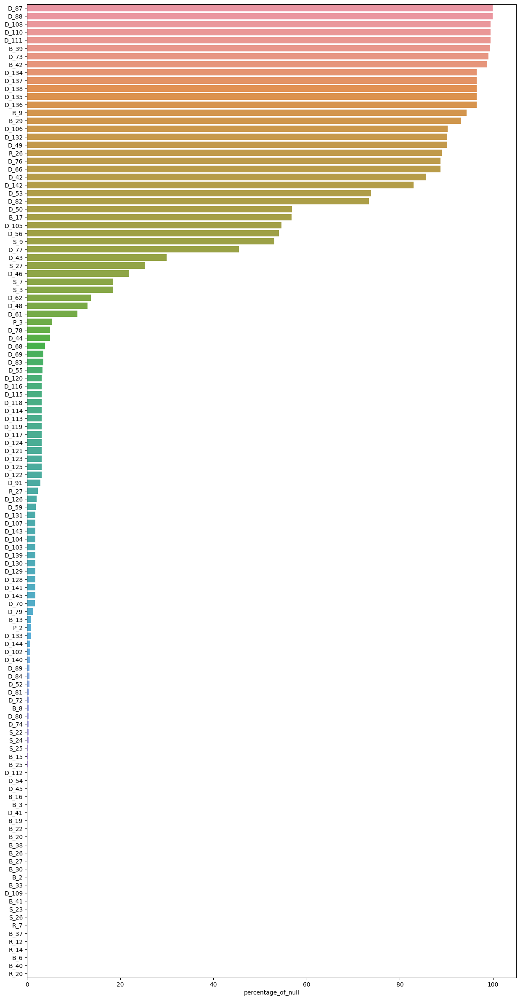

In [9]:
fig = plt.figure(figsize=(15,30))
sns.barplot(data=null,y=null.index,x=null['percentage_of_null'])
del null

### Insights

There are many missing values, especially in the delinquency variables, with D_87 having the highest number of nulls (99.93%).


## Dealing on the Categorical Values

In [10]:
# Define a list of column names that are considered categorical variables
categorical_cols = ['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']

# Initialize an empty list to hold the names of numerical columns
num_cols = []

# Loop through each column in the dataframe 'df_train'
for col in train_data.columns:
    # If the column is not in the list of categorical columns and is not 'customer_ID' or 'S_2',
    # it is treated as a numerical column
    if col not in categorical_cols + ['customer_ID', 'S_2']:
        # Add the numerical column to the list
        num_cols.append(col)

# Convert the list of numerical columns to a numpy array for efficiency and better handling
num_cols = np.array(num_cols)

# Print out the lists of categorical and numerical columns for verification
print("categorical cols: ", categorical_cols)
print("numerical cols: ", num_cols)


<IPython.core.display.Javascript object>

categorical cols:  ['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']
numerical cols:  ['P_2' 'D_39' 'B_1' 'B_2' 'R_1' 'S_3' 'D_41' 'B_3' 'D_42' 'D_43' 'D_44'
 'B_4' 'D_45' 'B_5' 'R_2' 'D_46' 'D_47' 'D_48' 'D_49' 'B_6' 'B_7' 'B_8'
 'D_50' 'D_51' 'B_9' 'R_3' 'D_52' 'P_3' 'B_10' 'D_53' 'S_5' 'B_11' 'S_6'
 'D_54' 'R_4' 'S_7' 'B_12' 'S_8' 'D_55' 'D_56' 'B_13' 'R_5' 'D_58' 'S_9'
 'B_14' 'D_59' 'D_60' 'D_61' 'B_15' 'S_11' 'D_62' 'D_65' 'B_16' 'B_17'
 'B_18' 'B_19' 'B_20' 'S_12' 'R_6' 'S_13' 'B_21' 'D_69' 'B_22' 'D_70'
 'D_71' 'D_72' 'S_15' 'B_23' 'D_73' 'P_4' 'D_74' 'D_75' 'D_76' 'B_24'
 'R_7' 'D_77' 'B_25' 'B_26' 'D_78' 'D_79' 'R_8' 'R_9' 'S_16' 'D_80' 'R_10'
 'R_11' 'B_27' 'D_81' 'D_82' 'S_17' 'R_12' 'B_28' 'R_13' 'D_83' 'R_14'
 'R_15' 'D_84' 'R_16' 'B_29' 'S_18' 'D_86' 'D_87' 'R_17' 'R_18' 'D_88'
 'B_31' 'S_19' 'R_19' 'B_32' 'S_20' 'R_20' 'R_21' 'B_33' 'D_89' 'R_22'
 'R_23' 'D_91' 'D_92' 'D_93' 'D_94' 'R_24' 'R_25' 'D_96' 'S_22' 'S_23'
 'S_24' 'S

In [11]:
train_data[categorical_cols]

,B_30,B_38,D_114,D_116,D_117,D_120,D_126,D_63,D_64,D_66,D_68
0,0.0,2.0,1.0,0.0,4.0,0.0,1.0,CR,O,NaN,6.0
1,0.0,2.0,1.0,0.0,4.0,0.0,1.0,CR,O,NaN,6.0
2,0.0,2.0,1.0,0.0,4.0,0.0,1.0,CR,O,NaN,6.0
3,0.0,2.0,1.0,0.0,4.0,0.0,1.0,CR,O,NaN,6.0
4,0.0,2.0,1.0,0.0,4.0,0.0,1.0,CR,O,NaN,6.0
...,...,...,...,...,...,...,...,...,...,...,...
5531446,0.0,3.0,1.0,0.0,3.0,0.0,1.0,CL,O,NaN,5.0
5531447,0.0,3.0,1.0,0.0,3.0,0.0,1.0,CL,O,NaN,5.0
5531448,0.0,3.0,1.0,0.0,3.0,0.0,1.0,CL,O,NaN,5.0
5531449,0.0,3.0,1.0,0.0,3.0,0.0,1.0,CL,O,NaN,5.0



In the generated plot, I illustrate the distribution of features across various financial categories using a bar chart. Each category, such as Delinquency, Spend, Payment, Balance, and Risk, is represented along the x-axis, while the count of columns belonging to each category is depicted along the y-axis.

The height of each colored bar corresponds to the number of columns within that particular financial category. This visualization aids in understanding how the features are distributed across different aspects of financial data within the dataset. Despite including a legend in the code, it may not provide additional insights since there are no specific labels associated with each category.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

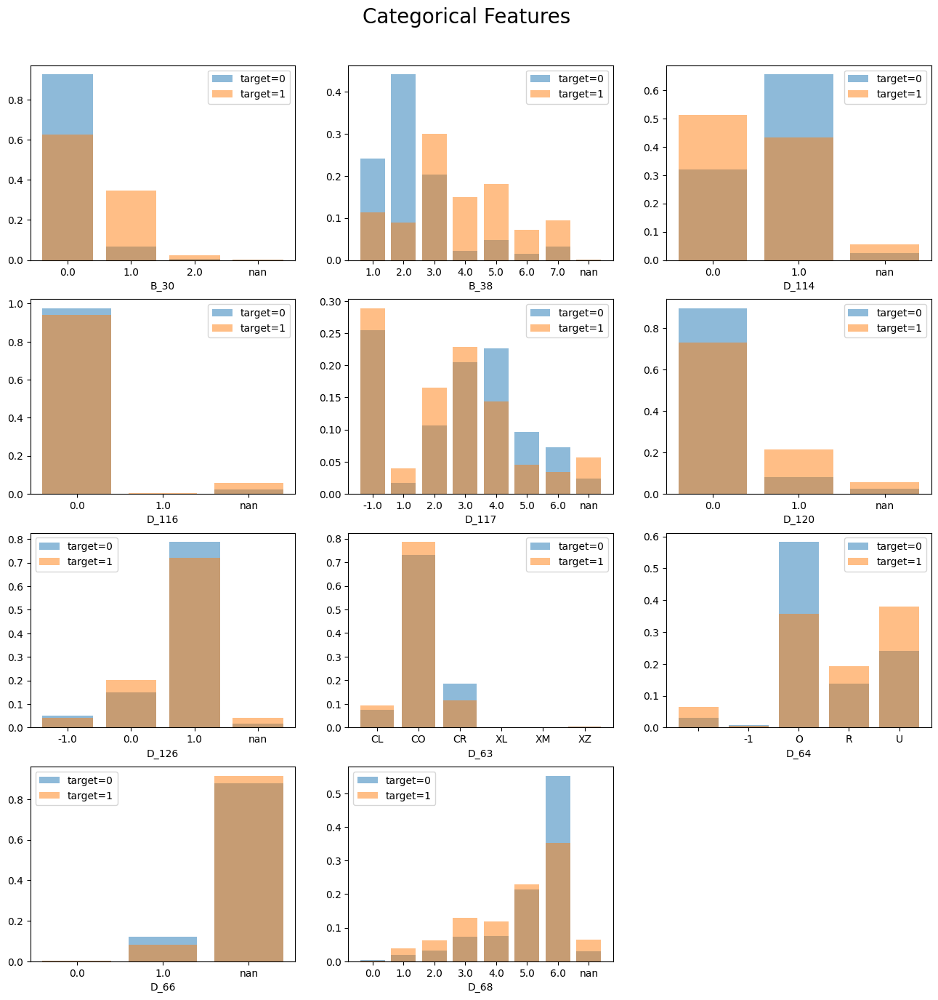

In [12]:
# Set the figure size for the plot
plt.figure(figsize=(16, 16))

# Iterate through each categorical feature
for i, f in enumerate(cat_features):
    # Create subplots with 4 rows, 3 columns, and increment the subplot index by 1
    plt.subplot(4, 3, i+1)
    
    # Calculate and plot the distribution of values for target=0
    temp = pd.DataFrame(train_data[f][train_data.target == 0].value_counts(dropna=False, normalize=True).sort_index().rename('count'))
    temp.index.name = 'value'
    temp.reset_index(inplace=True)
    plt.bar(temp.index, temp['count'], alpha=0.5, label='target=0')
    
    # Calculate and plot the distribution of values for target=1
    temp = pd.DataFrame(train_data[f][train_data.target == 1].value_counts(dropna=False, normalize=True).sort_index().rename('count'))
    temp.index.name = 'value'
    temp.reset_index(inplace=True)
    plt.bar(temp.index, temp['count'], alpha=0.5, label='target=1')
    
    # Set x-axis label
    plt.xlabel(f)
    
    # Add legend to the plot
    plt.legend()
    
    # Set x-axis ticks to match the values
    plt.xticks(temp.index, temp.value)

# Add overall title to the plot
plt.suptitle('Categorical Features', fontsize=20, y=0.93)

# Show the plot
plt.show()

# Delete the temporary DataFrame 'temp'
del temp



## Observations:
Every categorical attribute consists of a maximum of eight distinct categories, enabling the possibility of employing One-hot encoding. I intend to examine both one-hot encoding and ordinal encoding methodologies in my modeling notebook.

The disparities in distributions between target=0 and target=1 suggest that categorical attributes offer predictive insights into the target variable. Hence, it is advisable to explore the modeling of these categorical variables.

The attributes D_114, D_116, D_120, and D_66 are binary in nature, with values restricted to 0, 1, or left as missing.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


<IPython.core.display.Javascript object>

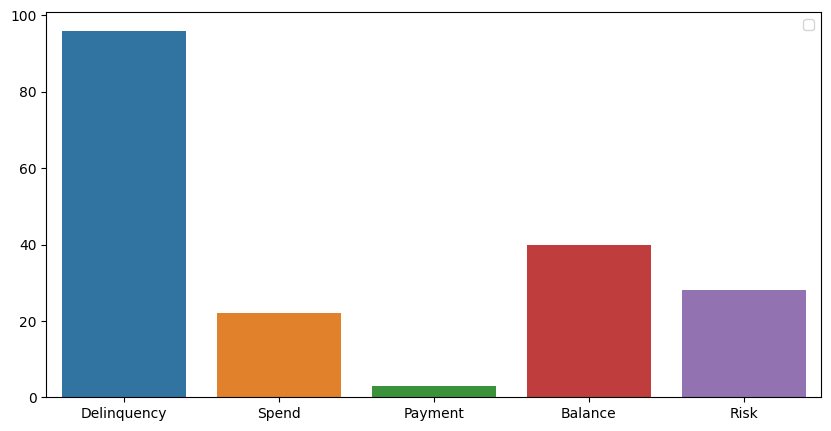

In [13]:
# Extract columns starting with 'D_' representing delinquency features from the train_data
D_cols = train_data.columns[pd.Series(train_data.columns).str.startswith('D_')]
# Extract columns starting with 'B_' representing balance features from the train_data
B_cols = train_data.columns[pd.Series(train_data.columns).str.startswith('B_')]
# Extract columns starting with 'S_' representing spending features from the train_data
S_cols = train_data.columns[pd.Series(train_data.columns).str.startswith('S_')]
# Extract columns starting with 'R_' representing risk features from the train_data
R_cols = train_data.columns[pd.Series(train_data.columns).str.startswith('R_')]
# Extract columns starting with 'P_' representing payment features from the train_data
P_cols = train_data.columns[pd.Series(train_data.columns).str.startswith('P_')]

# Create a dictionary to map feature category names to their counts
Dict = {
    'Delinquency': len(D_cols), 
    'Spend': len(S_cols), 
    'Payment': len(P_cols), 
    'Balance': len(B_cols), 
    'Risk': len(R_cols),
}

# Set up the figure size for the bar plot
plt.figure(figsize=(10, 5))
# Create a bar plot to visualize the number of columns in each category
sns.barplot(x=list(Dict.keys()), y=list(Dict.values()))
# Add a legend to the plot
plt.legend();


## Visualization of Numerical Features



 #### Delinquency Variables

In [14]:
# Calculate and print the number of delinquency features in the dataset
print(f"Number of delinquency features: {len([f for f in train_data.columns if (f not in  ['customer_ID', 'target', 'S_2']) and (f.startswith(('D')))])}")

# Extract and sort the numerical delinquency features from the dataset
delin_features = sorted([f for f in train_data.columns if (f not in cat_features + ['customer_ID', 'target', 'S_2']) and (f.startswith(('D')))])

# Calculate and print the number of numerical delinquency features
print(f"Number of numerical delinquency features: {len(delin_features)}")


Number of delinquency features: 96
Number of numerical delinquency features: 87


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

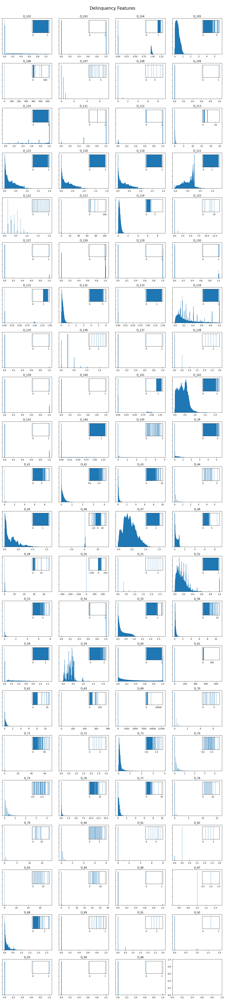

In [15]:
def plot_hist(features, title):
    # Create a figure and an array of subplots based on the number of features
    fig, axs = plt.subplots(int(len(features)/4)+(1 if len(features)%4!=0 else 0),4, figsize=(15,3*(int(len(features)/4)+(1 if len(features)%4!=0 else 0))))

    # Set the main title for the entire plot
    plt.suptitle(f'\n{title}', fontsize=20, y=1)

    # Iterate through each feature and plot its histogram
    for i, f in enumerate(features):
        # Determine the current subplot for the feature
        ax = axs[int(i/4), i%4] if ((int(len(features)/4)+(1 if len(features)%4!=0 else 0))>1) else axs[i%4]
        
        # Plot the histogram for the current feature
        ax.hist(train_data[f], bins=200)
        
        # Set the title of the subplot to the feature name
        ax.set_title(f)

        # Create a smaller inset subplot within the larger subplot
        inset_ax = ax.inset_axes([0.6, 0.6, 0.35, 0.35])  # [left, bottom, width, height]
        inset_ax.hist(train_data[f], bins=200)
        inset_ax.set_ylim([0,0.001])
        inset_ax.set_yticks([])
        
        # Hide the y-axis labels for the main subplot
        ax.set_yticklabels([])

    # Adjust the layout of subplots to prevent overlap
    plt.tight_layout()
    
    # Display the plot
    plt.show()

# Call the function to plot histograms for delinquency features
plot_hist(delin_features, 'Delinquency Features')


Drawing from the histogram plots, certain attributes like D_103 initially exhibit a discrete pattern. However, upon closer inspection of the plots, it becomes apparent that there is additional noise overlaying the values. For instance, D_103 spans the range [0, 0.01] and [1, 1.01]. This phenomenon might be attributed to the incorporation of noise into the data, potentially as a means of anonymizing customer information by AMEX.



Some of the plots have white space at the left or right end. This may show that there aer some outliers or rare events in the data.

It is possible to remove this added noise. This will likely result in higher model accuracy. We can use a transformatiom such as: train_data['D_103'] = train_data['D_103'].apply(lambda t: np.floor(t))



If the two distributions (default vs. paid) are very separate for a feature, it shows that the feature could have useful information about the target and should be used in predictive modelling.

For some of the features such as D_134, D_121, etc., the distribution for bad customers is similar in shape to the distribution of good customers, but the distribution is shifted up or down in the y axis. This may show similar overall behavioral pattern for good and bad customers. The shift in the scale of the distribution could show that the scale of the behavior (such as amout spent) is different for the two groups.

##  Relationship Among Delinquency Features

In [16]:
def plot_corr_heatmap(features, title):
    # Calculate the correlation matrix for the provided features
    corr = last_statement_df[features].iloc[:,:-1].corr()

    # Create a mask to hide the upper triangle of the correlation matrix
    mask = np.triu(np.ones_like(corr, dtype=bool))[1:,:-1]
    
    # Extract the lower triangle of the correlation matrix
    corr = corr.iloc[1:,:-1].copy()

    # Create a figure and axis for the heatmap
    fig, ax = plt.subplots(figsize=(48,48))
    
    # Plot the heatmap with correlation values and annotations
    sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, center=0, annot=True, fmt='.2f', cmap='viridis', annot_kws={'fontsize':10,'fontweight':'bold'}, cbar=False)

    # Remove ticks from both x and y axes
    ax.tick_params(left=False, bottom=False)
    
    # Rotate and align x-axis tick labels for better readability
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=12)
    
    # Set font size for y-axis tick labels
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)

    # Set the title for the heatmap
    plt.title(f'{title}\n', fontsize=26)
    
    # Display the plot
    fig.show()


In [17]:
last_statement_df = train_data.groupby('customer_ID').tail(1).set_index('customer_ID')

In [18]:
cols=[col for col in last_statement_df.columns if (col.startswith(('D','t'))) & (col not in cat_features)]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

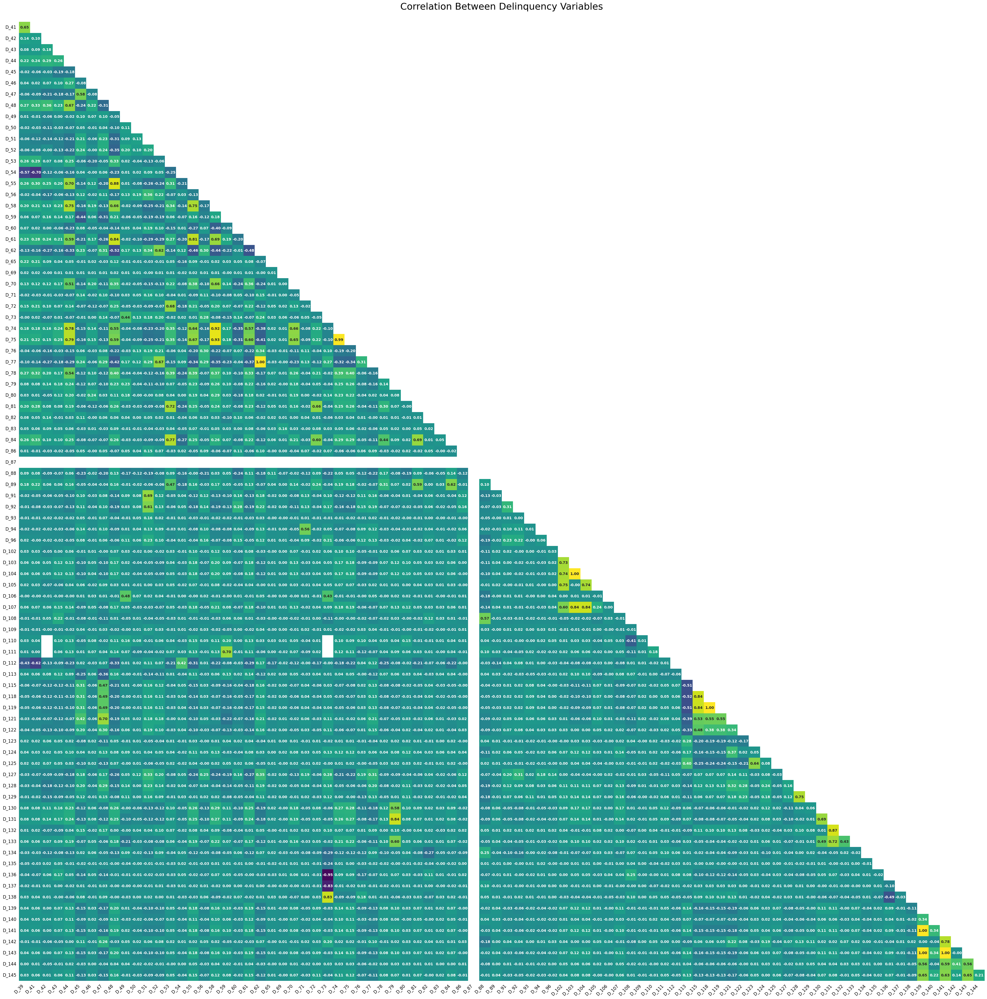

In [19]:
plot_corr_heatmap(cols, 'Correlation Between Delinquency Variables')


Several of the delinquency variables exhibit strong correlations.

In [20]:
# Select columns that start with 'D' or 't' and are not in the list of categorical features
cols = [col for col in last_statement_df.columns if (col.startswith(('D', 't'))) and (col not in cat_features)]

# Calculate the correlation matrix for the selected columns
corr = last_statement_df[cols].iloc[:, :-1].corr()

# Fill the diagonal of the correlation matrix with 0.0
np.fill_diagonal(corr.values, 0.0)

# Create a mask to hide the upper triangle of the correlation matrix
mask = np.triu(np.ones_like(corr, dtype=bool))

# Mask the upper triangle of the correlation matrix
corr = corr.mask(mask)

# Find pairs of highly correlated features (correlation coefficient > 0.9)
highly_correlated_features = corr[np.abs(corr) > 0.9].stack().reset_index()

# Sort the pairs by the absolute correlation coefficient in descending order
highly_correlated_features = highly_correlated_features.iloc[abs(highly_correlated_features[0]).argsort()[::-1]].reset_index()

# Display the highly correlated features
highly_correlated_features


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,index,level_0,level_1,0
0,3,D_77,D_62,0.999824
1,4,D_104,D_103,0.999745
2,8,D_143,D_139,0.999602
3,7,D_141,D_139,0.998100
4,9,D_143,D_141,0.997739
5,5,D_119,D_118,0.996339
6,2,D_75,D_74,0.988533
7,6,D_136,D_73,-0.953685
8,1,D_75,D_58,0.927898
9,0,D_74,D_58,0.923637


In [21]:
def plot_highly_correlated_features(features, title, highly_correlated_features):
    # Create a figure and an array of subplots based on the number of highly correlated features
    fig, axs = plt.subplots(int(len(highly_correlated_features)/4)+(1 if len(highly_correlated_features)%4!=0 else 0), 4, figsize=(16,5*(int(len(highly_correlated_features)/4)+(1 if len(highly_correlated_features)%4!=0 else 0))))
    
    # Initialize index variable
    i = 0
    
    # Iterate through pairs of highly correlated features
    for f, g in zip(highly_correlated_features.level_0, highly_correlated_features.level_1):
        # Determine the current subplot for the feature pair
        ax = axs[int(i/4), i%4] if ((int(len(highly_correlated_features)/4)+(1 if len(highly_correlated_features)%4!=0 else 0))>1) else axs[i%4]
        
        # Plot scatter plot for the feature pair if it's not the 8th pair
        if(i != 7):
            ax.hexbin(x=f, y=g, data=last_statement_df[features], bins='log', gridsize=40, cmap='inferno')
            ax.set(xlabel=f, ylabel=g)
            ax.text(0.05, 0.9, 'Correlation: {:.4f}'.format(highly_correlated_features[0][i]), transform=ax.transAxes, bbox=dict(boxstyle="round,pad=0.3", fc="white"))
            ax.tick_params(left=False, bottom=False)
        else:
            # Plot scatter plot for the 8th pair (which is not hexbin)
            ax.plot(last_statement_df[features][f], last_statement_df[features][g], '.')
            ax.set(xlabel=f, ylabel=g)
            ax.text(0.05, 0.9, 'Correlation: {:.4f}'.format(highly_correlated_features[0][i]), transform=ax.transAxes, bbox=dict(boxstyle="round,pad=0.3", fc="white"))
            ax.tick_params(left=False, bottom=False)

        # Increment index
        i += 1

    # Remove spines from the plot
    sns.despine()
    
    # Set the main title for the entire plot
    fig.suptitle(f'\n{title})', fontsize=14)
    
    # Show the plot
    plt.show()


In [22]:
def plot_highly_correlated_featuers(features, title, highly_correlated_features):
    # Calculate the number of subplots needed based on the count of highly correlated features. Arrange subplots in a grid that has 4 columns.
    # The grid size adjusts based on the number of pairs to ensure all plots fit.
    fig, axs = plt.subplots(int(len(highly_correlated_features)/4)+(1 if len(highly_correlated_features)%4!=0 else 0),4, figsize=(16,5*(int(len(highly_correlated_features)/4)+(1 if len(highly_correlated_features)%4!=0 else 0))))
    i=0
    for f,g in zip(highly_correlated_features.level_0, highly_correlated_features.level_1):

        # Determine the correct subplot position for the current feature pair.
        # Adjusts for cases with a single row or multiple rows of subplots.
        ax = axs[int(i/4), i%4] if ((int(len(highly_correlated_features)/4)+(1 if len(highly_correlated_features)%4!=0 else 0))>1) else axs[i%4]
         
        # Special case for a specific subplot (e.g., the eighth one, index 7) to use a dot plot instead of a hexbin plot.
        if(i==7):
            ax.plot(last_statement_df[features][f], last_statement_df[features][g], '.')
            ax.set(xlabel=f,ylabel=g)
            ax.text(0.05, 0.9, 'Correlation: {:.4f}'.format(highly_correlated_features[0][i]), transform=ax.transAxes, bbox=dict(boxstyle="round,pad=0.3",fc="white"))
            ax.tick_params(left=False,bottom=False)

            i = i + 1
            continue
        

     # For other plots, use a hexbin plot to show the density of points with logarithmic binning.
        ax.hexbin(x=f, y=g, data=last_statement_df[features], bins='log', gridsize=40, cmap='inferno')
        ax.set(xlabel=f,ylabel=g)

        ax.text(0.05, 0.9, 'Correlation: {:.4f}'.format(highly_correlated_features[0][i]), transform=ax.transAxes, bbox=dict(boxstyle="round,pad=0.3",fc="white"))
        # Remove ticks for a cleaner look.
        ax.tick_params(left=False,bottom=False)
        i = i + 1

    sns.despine()  # Remove the top and right spines from all plots for a neater appearance.
    fig.suptitle(f'\n{title})',fontsize=14)
    plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

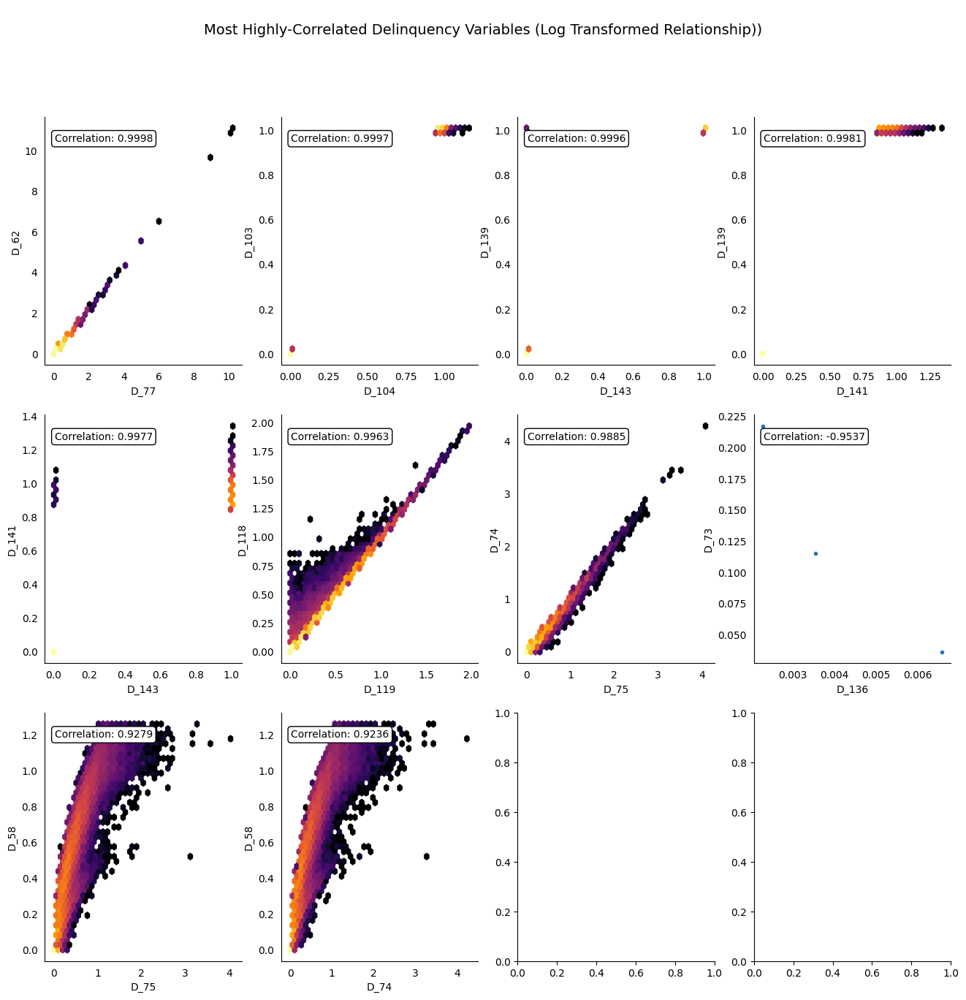

In [23]:
plot_highly_correlated_featuers(cols, 'Most Highly-Correlated Delinquency Variables (Log Transformed Relationship)', highly_correlated_features)

Several Delinquency variables display strong correlations, with the highest correlation coefficient reaching 0.999824, observed between D_77 and D_62.

There are some missing correlations evident in the correlation heatmap, which can be attributed to null values present in the dataset.

#### Spend Variables

In [24]:
spend_features = sorted([f for f in train_data.columns if (f not in ['customer_ID', 'target', 'S_2']) and (f.startswith(('S')))])
print(f"Number of spend features: {len(spend_features)}")
print(f"Number of numerical spend features: {len([f for f in spend_features if f not in cat_features])}")

Number of spend features: 21
Number of numerical spend features: 21


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

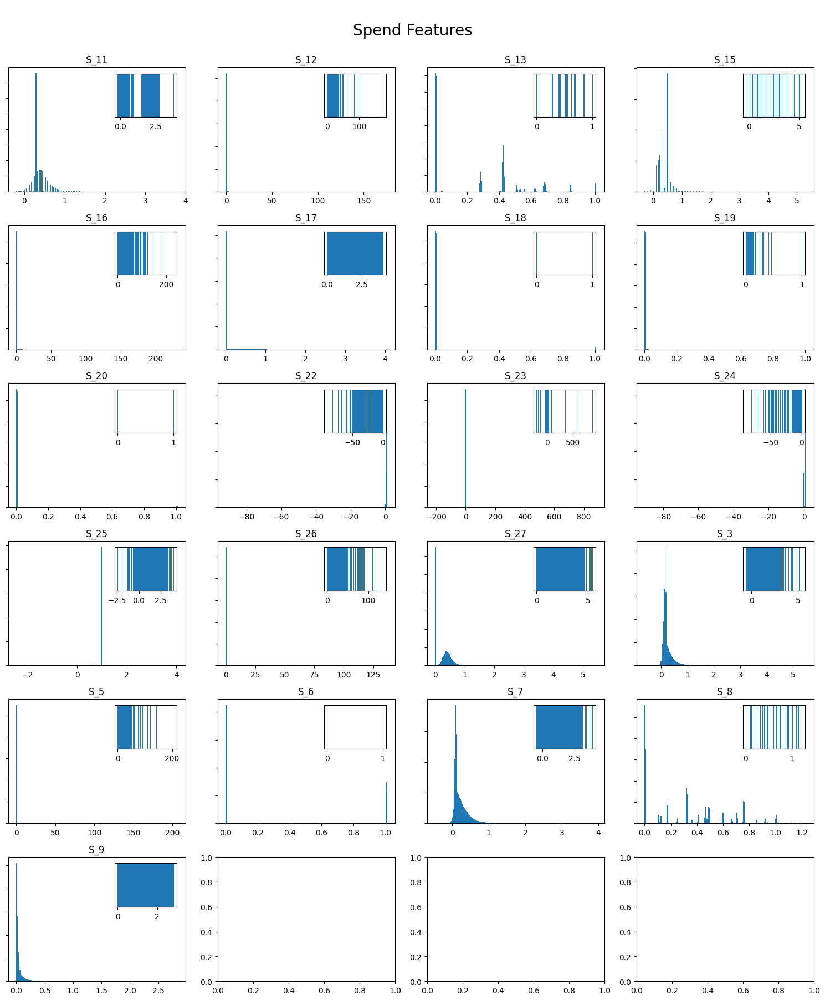

In [25]:
plot_hist(spend_features, 'Spend Features')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

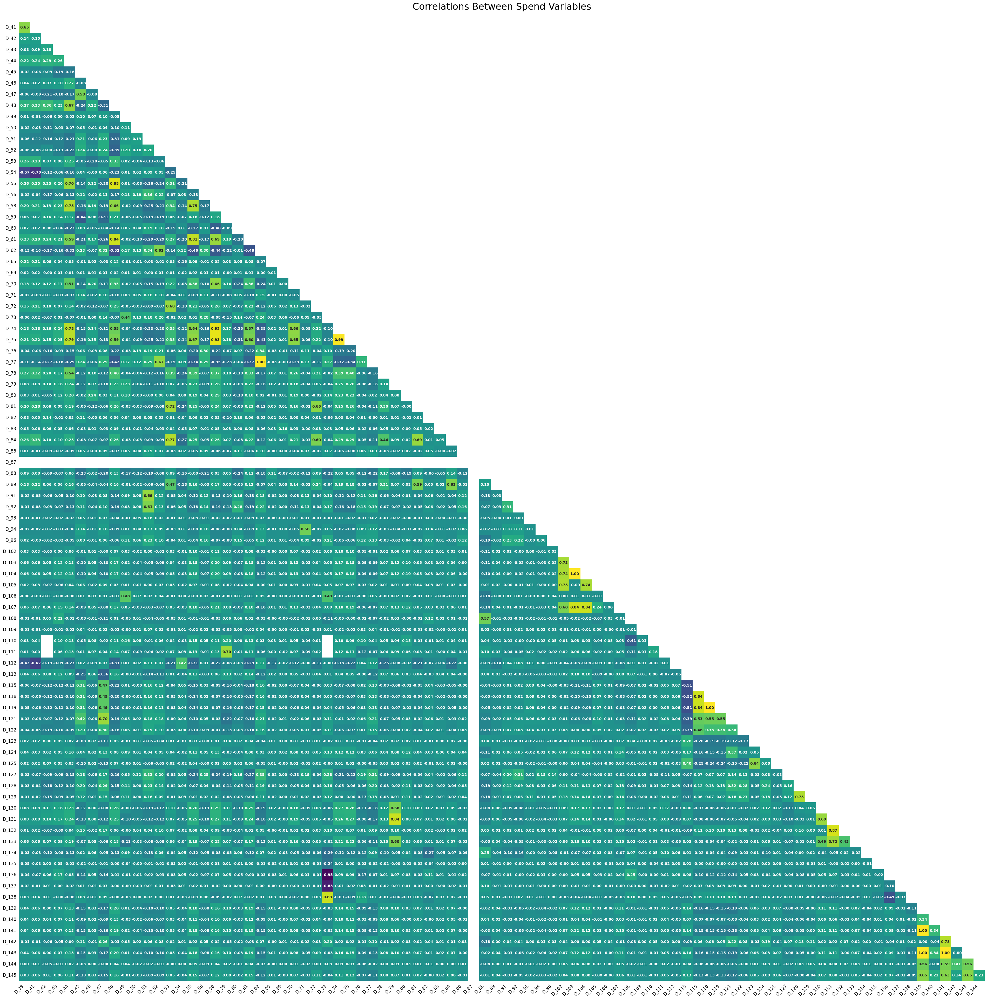

In [26]:
plot_corr_heatmap(cols, 'Correlations Between Spend Variables')

In [27]:
# Calculate the correlation matrix for the selected columns
corr = last_statement_df[cols].iloc[:,:-1].corr()

# Fill the diagonal of the correlation matrix with 0.0 to avoid self-correlation
np.fill_diagonal(corr.values, 0.0)

# Create a mask to hide the upper triangle of the correlation matrix
mask = np.triu(np.ones_like(corr, dtype=bool))

# Mask the upper triangle of the correlation matrix
corr = corr.mask(mask)

# Find pairs of highly correlated features (correlation coefficient > 0.9)
highly_correlated_features = corr[np.abs(corr) > 0.9].stack().reset_index()

# Sort the pairs by the absolute correlation coefficient in descending order
highly_correlated_features = highly_correlated_features.iloc[abs(highly_correlated_features[0]).argsort()[::-1]].reset_index()

# Display the highly correlated features
highly_correlated_features


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,index,level_0,level_1,0
0,3,D_77,D_62,0.999824
1,4,D_104,D_103,0.999745
2,8,D_143,D_139,0.999602
3,7,D_141,D_139,0.998100
4,9,D_143,D_141,0.997739
5,5,D_119,D_118,0.996339
6,2,D_75,D_74,0.988533
7,6,D_136,D_73,-0.953685
8,1,D_75,D_58,0.927898
9,0,D_74,D_58,0.923637


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

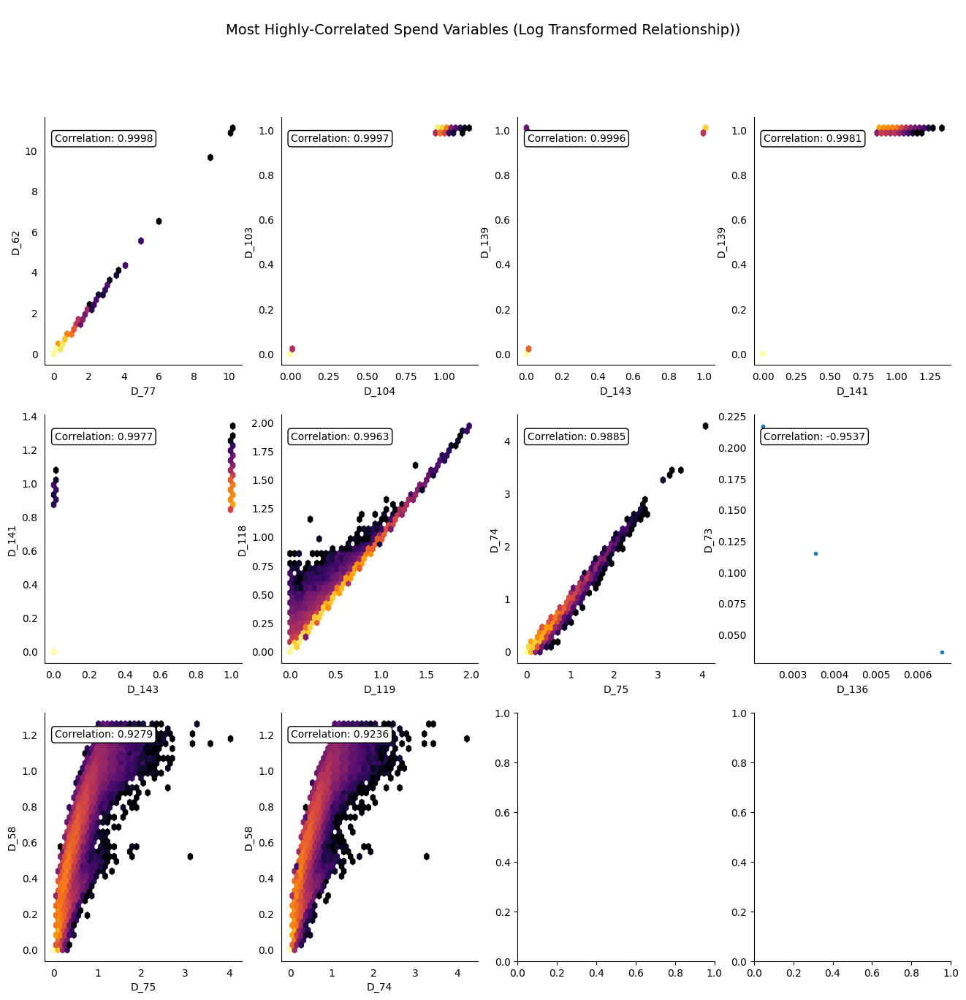

In [28]:
plot_highly_correlated_featuers(cols, 'Most Highly-Correlated Spend Variables (Log Transformed Relationship)', highly_correlated_features)


The hist plots illustrate noticeable disparities in distributions between target values of 0 and 1. It appears that the spend variables carry significant information regarding the target and warrant inclusion in modeling efforts.

Several spend features exhibit strong correlations, notably S_22 and S_24 with a Pearson correlation coefficient of 0.965. It's important to note that Pearson's correlation coefficient solely evaluates linear relationships, potentially overlooking nonlinear associations.

#### Payment Variables

In [29]:
payment_features = sorted([f for f in train_data.columns if (f not in ['customer_ID', 'target', 'S_2']) and (f.startswith(('P')))])
print(f"Number of payment features: {len(payment_features)}")
print(f"Number of numerical payment features: {len([f for f in payment_features if f not in cat_features])}")

Number of payment features: 3
Number of numerical payment features: 3


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

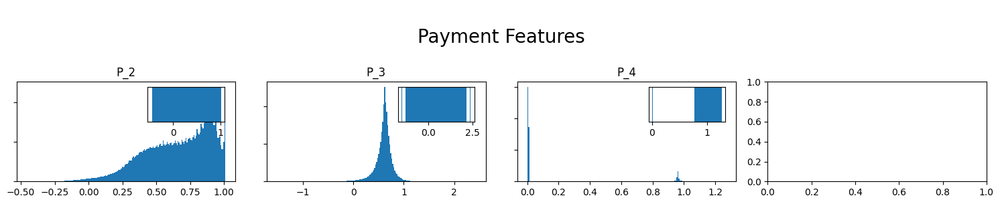

In [30]:
plot_hist(payment_features, 'Payment Features')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

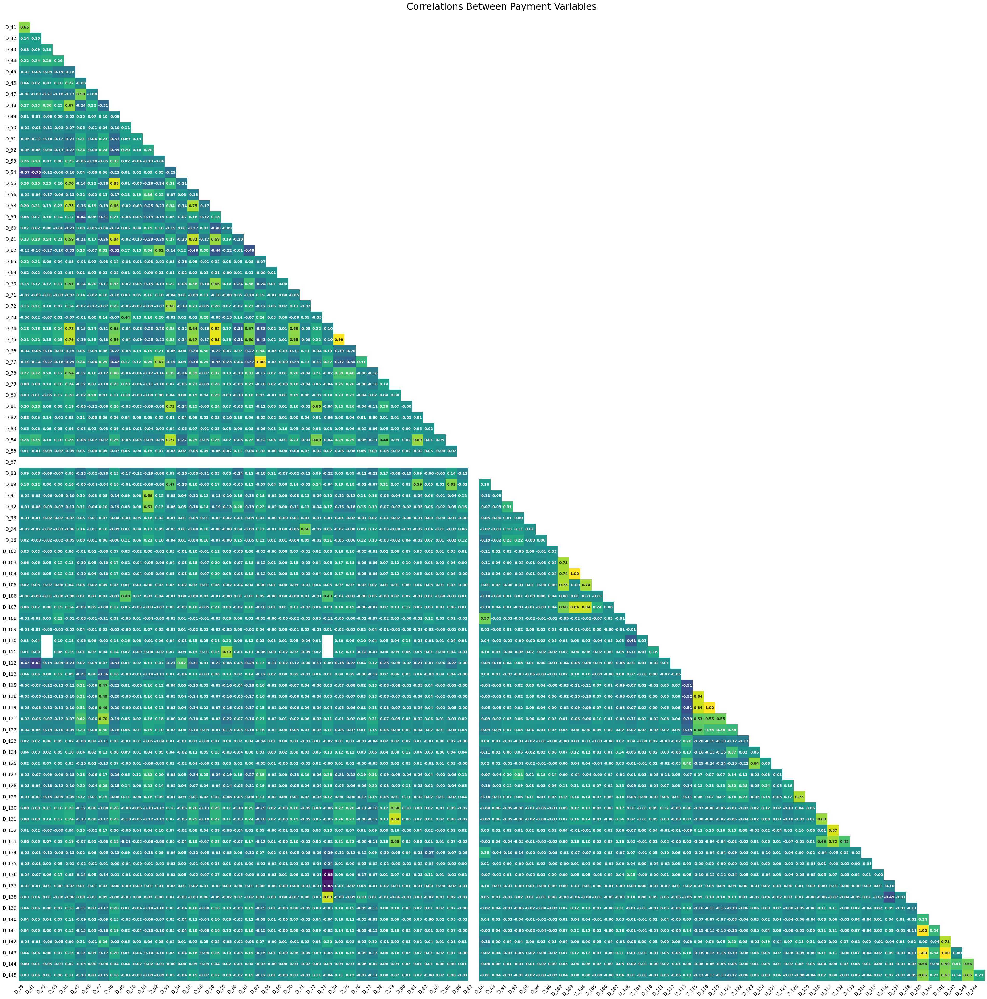

In [31]:
plot_corr_heatmap(cols, 'Correlations Between Payment Variables')


There are just three payment factors, and they don't show strong correlation with each other.

According to the KDE plot, P_2 appears to provide the most relevant information about the target.

#### Balance Variables

In [32]:
balance_features = sorted([f for f in train_data.columns if (f not in  ['customer_ID', 'target', 'S_2']) and (f.startswith(('B')))])
print(f"Number of balance features: {len(balance_features)}")
print(f"Number of numerical balance features: {len([f for f in balance_features if f not in cat_features])}")

Number of balance features: 40
Number of numerical balance features: 38


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

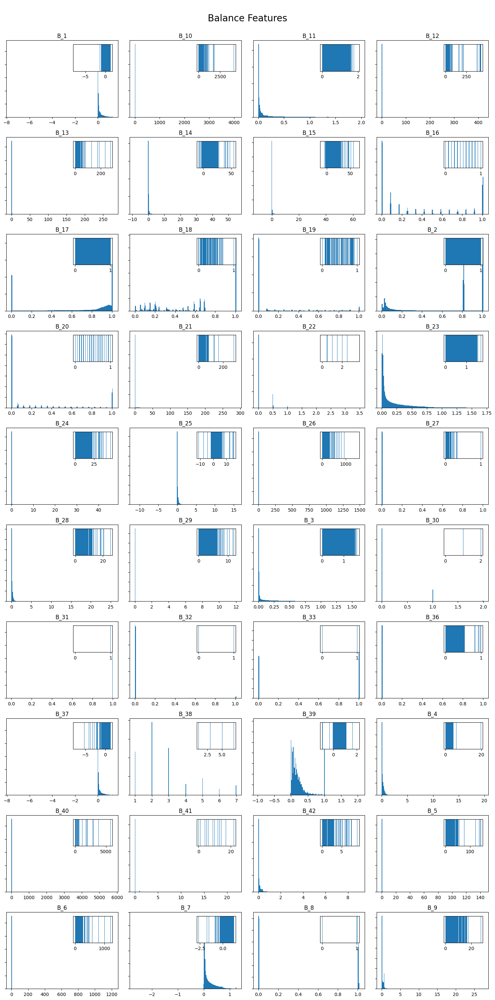

In [33]:
plot_hist(balance_features, 'Balance Features')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

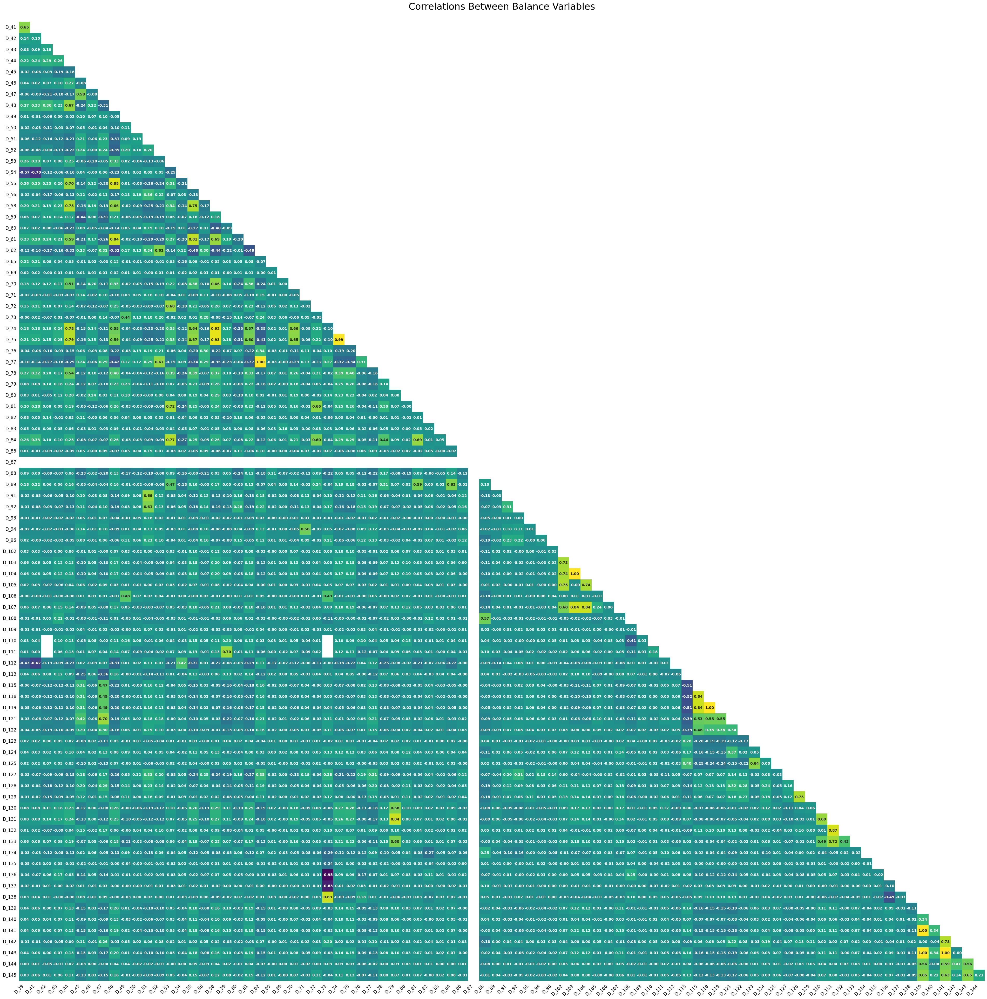

In [34]:
plot_corr_heatmap(cols, 'Correlations Between Balance Variables')


There are 38 numerical balance features and 2 categorical balance features, with some showing significant correlations. These features contain valuable information related to the target variable and will be incorporated into the modeling process. Upon examination of the hist plots, it appears that certain variables exhibit outlier values.

#### Risk Variables

In [35]:
risk_features = sorted([f for f in train_data.columns if (f not in ['customer_ID', 'target', 'S_2']) and (f.startswith(('R')))])
print(f"Number of risk features: {len(risk_features)}")
print(f"Number of numerical risk features: {len([f for f in risk_features if f not in cat_features])}")

Number of risk features: 28
Number of numerical risk features: 28


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

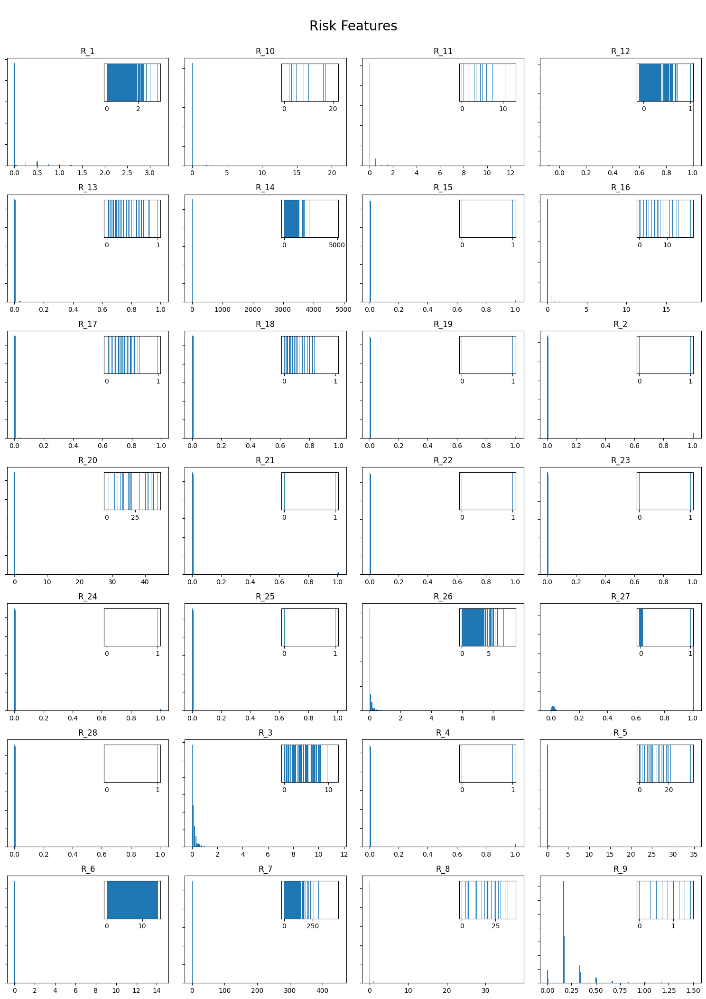

In [36]:
plot_hist(risk_features, 'Risk Features')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

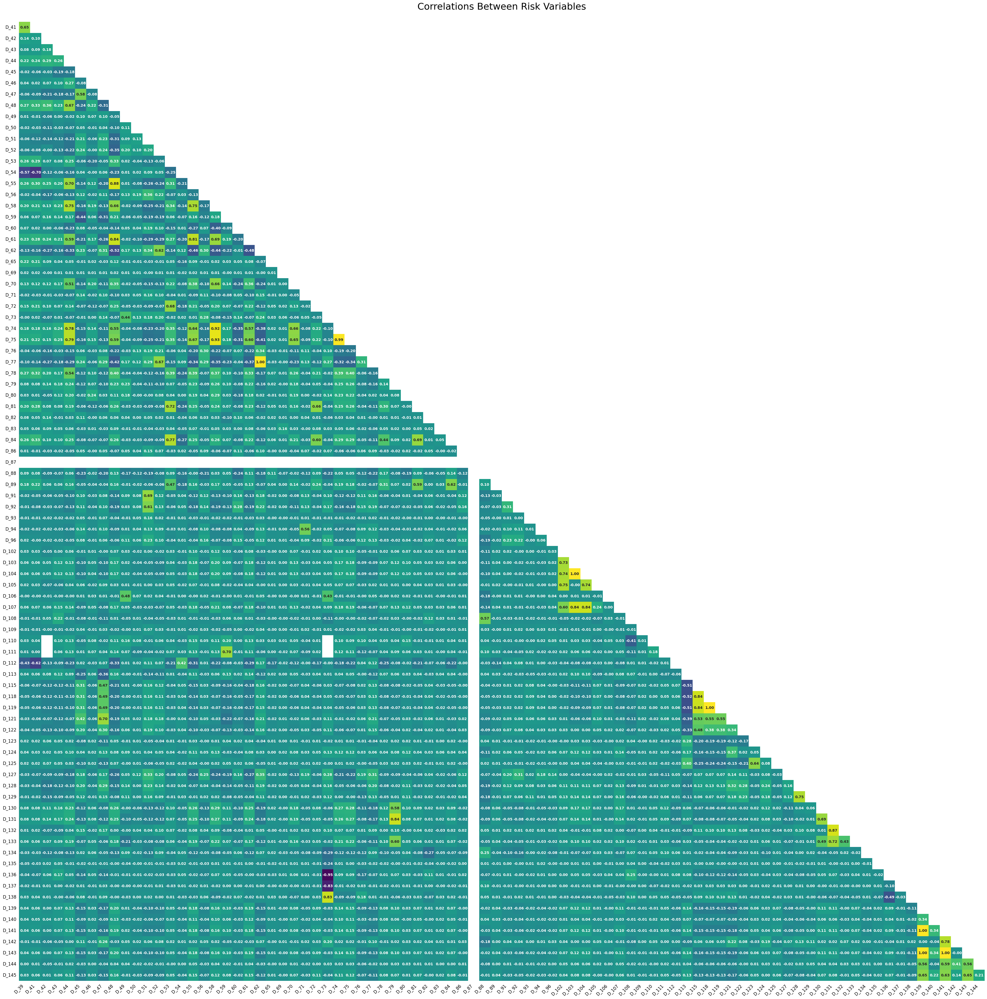

In [37]:
plot_corr_heatmap(cols, 'Correlations Between Risk Variables')

There are 28 numerical risk attributes and zero categorical ones in the dataset.

Most risk factors exhibit low levels of correlation with each other, with the exception of R_5 and R_8, which show the highest correlation.

These variables hold valuable information about the target and will be integrated into the modeling procedure with care.

## Relationship between Features and the Target

/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

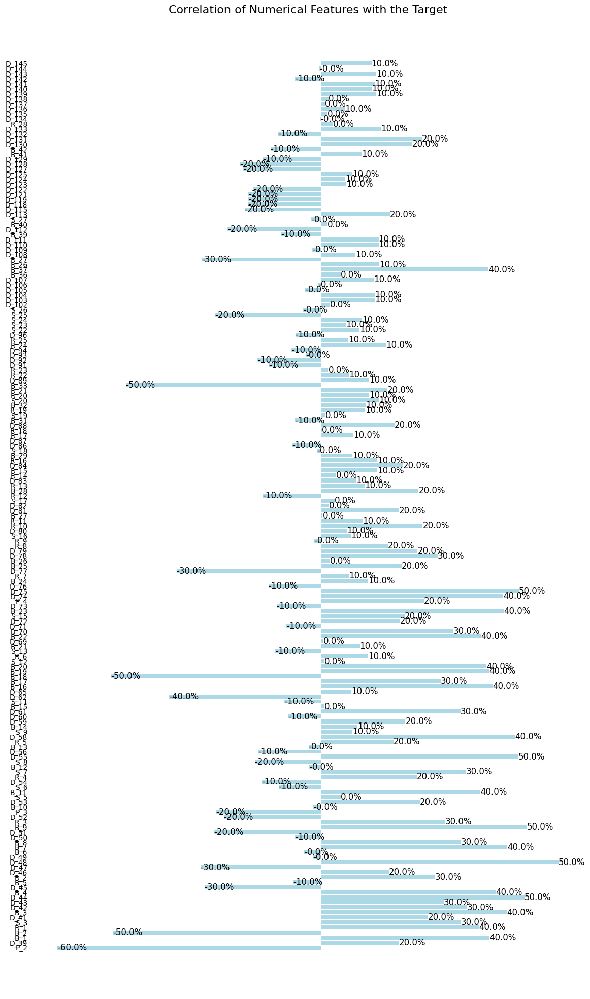

In [38]:
# Selecting numerical columns from the training data, excluding the 'target' column,
# and computing correlation with the 'target' column.
targ = train_data.select_dtypes(include='number').drop(["target"], axis=1).corrwith(train_data['target'], axis=0)
val = [str(round(v ,1) *100) + '%' for v in targ.values]

# Formatting the correlation values to percentage strings rounded to 1 decimal place.
fig, ax = plt.subplots(figsize=(14, 25))
bars = ax.barh(targ.index, targ.values, color="lightblue")

for bar, label in zip(bars, val):
    ax.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, label,ha='left', va='center', fontsize=12)


# Annotating each bar with its corresponding percentage value.
# The loop iterates over the bars and their labels, positioning the label
# according to the bar's width and height for proper alignment.
ax.set_title("Correlation of Numerical Features with the Target", fontsize=16)
ax.set_facecolor('none')
ax.tick_params(axis='y', which='both', left=False)

ax.set_xticks([])
ax.set_xticklabels([])

ax.spines[['top', 'bottom', 'left', 'right']].set_visible(False)
plt.show()


Examining the relationship between features and the target variable reveals correlations spanning from -61% to 50%.

P_2 exhibits the strongest negative correlation with the target at -61%.

Exploring the utilization of the most highly correlated features in modeling could yield promising results. .

## Model Development



Due to the dataset's substantial size, I'm constrained by memory limitations and can only work with a subset of 10,000 datasets. 

Containing 5.5 million rows, the dataset exceeds my available memory capacity during model training. Consequently, I'm restricting my analysis to the first 10,000 rows of data.

For my analysis, I'll be focusing solely on the numerical features, opting to drop the 11 categorical features.

In [39]:
train_data = pd.read_feather("../input/amexfeather/train_data.ftr").iloc[:10000,:]
categorical_features = ['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']

train_data = train_data.drop(columns = categorical_features)



<IPython.core.display.Javascript object>

In [40]:
train_data.head()

,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,...,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,target
0,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-03-09,0.938477,0.001734,0.008728,1.006836,0.009224,0.124023,0.008774,0.004707,...,NaN,NaN,0.002426,0.003706,0.003819,NaN,0.000569,0.000610,0.002674,0
1,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-04-07,0.936523,0.005775,0.004925,1.000977,0.006153,0.126709,0.000798,0.002714,...,NaN,NaN,0.003956,0.003166,0.005032,NaN,0.009575,0.005493,0.009216,0
2,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-05-28,0.954102,0.091492,0.021652,1.009766,0.006817,0.123962,0.007599,0.009422,...,NaN,NaN,0.003269,0.007328,0.000427,NaN,0.003429,0.006985,0.002604,0
3,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-06-13,0.960449,0.002455,0.013687,1.002930,0.001372,0.117188,0.000685,0.005531,...,NaN,NaN,0.006119,0.004517,0.003201,NaN,0.008423,0.006527,0.009598,0
4,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-07-16,0.947266,0.002483,0.015190,1.000977,0.007607,0.117310,0.004654,0.009308,...,NaN,NaN,0.003672,0.004944,0.008888,NaN,0.001670,0.008125,0.009827,0


In [41]:
train_data = train_data.drop(["customer_ID","S_2"], axis=1)

In [42]:
train_data.isna().sum()

P_2         64
D_39         0
B_1          0
B_2          0
R_1          0
          ... 
D_142     8428
D_143      153
D_144       63
D_145      153
target       0
Length: 178, dtype: int64

There is a significant number of missing data. It is not reasonable to drop all columns or rows that have a missing value.

From my earlier histplots, we can infer that most features are not normaly distributed. It is either negatively skewed, positively skewed or no skew at all. With that said,it is difficult to identify the points that the features are centered, and to deal with the null values it makes sense to fill na with 0

In [43]:
train_data.fillna(0, inplace=True)

In [44]:
train_data.describe().T

/opt/conda/lib/python3.10/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: overflow encountered in square
  sqr = _ensure_numeric((avg - values) ** 2)


,count,mean,std,min,25%,50%,75%,max
P_2,10000.0,0.646484,0.256836,-2.568359e-01,0.465759,0.687500,0.864868,1.009766
D_39,10000.0,0.157104,0.275879,8.940697e-07,0.004574,0.009296,0.238037,4.269531
B_1,10000.0,0.126221,0.212402,-1.414795e-01,0.009125,0.032959,0.122696,1.323242
B_2,10000.0,0.617188,0.403076,3.433228e-05,0.091675,0.813965,1.001953,1.009766
R_1,10000.0,0.074036,0.219971,3.039837e-06,0.002863,0.005726,0.008530,2.259766
...,...,...,...,...,...,...,...,...
D_142,10000.0,0.058197,0.167236,-8.804321e-03,0.000000,0.000000,0.000000,1.185547
D_143,10000.0,0.160400,0.362549,0.000000e+00,0.002808,0.005835,0.008873,1.009766
D_144,10000.0,0.046082,0.173706,0.000000e+00,0.002638,0.005287,0.008087,1.342773
D_145,10000.0,0.056946,0.225220,0.000000e+00,0.002812,0.005846,0.008842,4.281250


The variation in ranges among the features will pose challenges for some of my ML models. Typically, it's advantageous to normalize input values to mitigate this issue. Data normalization is a vital preprocessing step in model development, promoting stable and efficient training, accelerated convergence, and enhanced generalization.



In [45]:
train_data.head(10)

,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,D_42,D_43,...,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,target
0,0.938477,0.001734,0.008728,1.006836,0.009224,0.124023,0.008774,0.004707,0.0,0.0,...,0.0,0.0,0.002426,0.003706,0.003819,0.0,0.000569,0.000610,0.002674,0
1,0.936523,0.005775,0.004925,1.000977,0.006153,0.126709,0.000798,0.002714,0.0,0.0,...,0.0,0.0,0.003956,0.003166,0.005032,0.0,0.009575,0.005493,0.009216,0
2,0.954102,0.091492,0.021652,1.009766,0.006817,0.123962,0.007599,0.009422,0.0,0.0,...,0.0,0.0,0.003269,0.007328,0.000427,0.0,0.003429,0.006985,0.002604,0
3,0.960449,0.002455,0.013687,1.002930,0.001372,0.117188,0.000685,0.005531,0.0,0.0,...,0.0,0.0,0.006119,0.004517,0.003201,0.0,0.008423,0.006527,0.009598,0
4,0.947266,0.002483,0.015190,1.000977,0.007607,0.117310,0.004654,0.009308,0.0,0.0,...,0.0,0.0,0.003672,0.004944,0.008888,0.0,0.001670,0.008125,0.009827,0
5,0.945801,0.001746,0.007866,1.004883,0.004219,0.110962,0.009857,0.009865,0.0,0.0,...,0.0,0.0,0.001925,0.008598,0.004528,0.0,0.000674,0.002222,0.002884,0
6,0.940918,0.002182,0.018860,1.007812,0.004509,0.103333,0.006603,0.000783,0.0,0.0,...,0.0,0.0,0.001336,0.004360,0.009384,0.0,0.007729,0.007660,0.002224,0
7,0.914551,0.003029,0.014328,1.000000,0.000263,0.108093,0.009529,0.007835,0.0,0.0,...,0.0,0.0,0.002398,0.008453,0.005554,0.0,0.001831,0.009613,0.007385,0
8,0.950684,0.009895,0.016891,1.003906,0.001789,0.102783,0.002520,0.009819,0.0,0.0,...,0.0,0.0,0.009743,0.003967,0.007942,0.0,0.008720,0.004368,0.000996,0
9,0.868652,0.001082,0.001930,1.007812,0.001772,0.100464,0.004627,0.006073,0.0,0.0,...,0.0,0.0,0.003611,0.009605,0.007267,0.0,0.008766,0.004753,0.009071,0


In [46]:
train_data["target"].value_counts()

target
0    7447
1    2553
Name: count, dtype: int64

In [47]:
X= train_data.drop("target", axis=1)
y= train_data["target"]


from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

# Fit and transform the data
X_s = scaler.fit_transform(X)


75% of the data will be used to train the model.

25% of the data will be used for validation.

In [48]:
x_train,x_test,y_train,y_test= train_test_split(X_s,y, train_size=0.75, random_state=20)

<IPython.core.display.Javascript object>

In [49]:
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from lightgbm import LGBMClassifier

In [50]:
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000)
,
    'Support Vector Classifier': SVC(),
    'Decision Tree Classifier': DecisionTreeClassifier(),
    'Light GBM Classifier': LGBMClassifier()
}

results = []

for model_name, model in models.items():
    kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, x_train, y_train, cv=kfold, scoring='accuracy')
    results.append([model_name, cv_scores.mean()])

results_df = pd.DataFrame(results, columns=['Model', 'Accuracy'])



[LightGBM] [Info] Number of positive: 1716, number of negative: 5034
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 37558
[LightGBM] [Info] Number of data points in the train set: 6750, number of used features: 172
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.254222 -> initscore=-1.076219
[LightGBM] [Info] Start training from score -1.076219
[LightGBM] [Info] Number of positive: 1716, number of negative: 5034
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.036452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 37573
[LightGBM] [Info] Number of data points in the train set: 6750, number of used features: 172
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.254222 -> initscore=-1.076219
[LightGBM] [Info] Start training from score -1.076219
[LightGBM] [In

<IPython.core.display.Javascript object>

In [51]:
results_df.index = range(1, 5)

results_df

,Model,Accuracy
1,Logistic Regression,0.900667
2,Support Vector Classifier,0.954400
3,Decision Tree Classifier,0.924933
4,Light GBM Classifier,0.980000


In [52]:
from sklearn.metrics import accuracy_score


# Training each model on the full training dataset and evaluating on the test dataset
test_results = []

for model_name, model in models.items():
    # Fit model
    model.fit(x_train, y_train)
    # Predict on test data
    y_pred = model.predict(x_test)
    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    # Append results
    test_results.append([model_name, accuracy])

# Creating a DataFrame to display the results
test_results_df = pd.DataFrame(test_results, columns=['Model', 'Test Accuracy'])

# Print or return the DataFrame
print(test_results_df)


[LightGBM] [Info] Number of positive: 1906, number of negative: 5594
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 37743
[LightGBM] [Info] Number of data points in the train set: 7500, number of used features: 173
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.254133 -> initscore=-1.076688
[LightGBM] [Info] Start training from score -1.076688


<IPython.core.display.Javascript object>

                       Model  Test Accuracy
0        Logistic Regression         0.8996
1  Support Vector Classifier         0.9568
2   Decision Tree Classifier         0.9224
3       Light GBM Classifier         0.9820


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

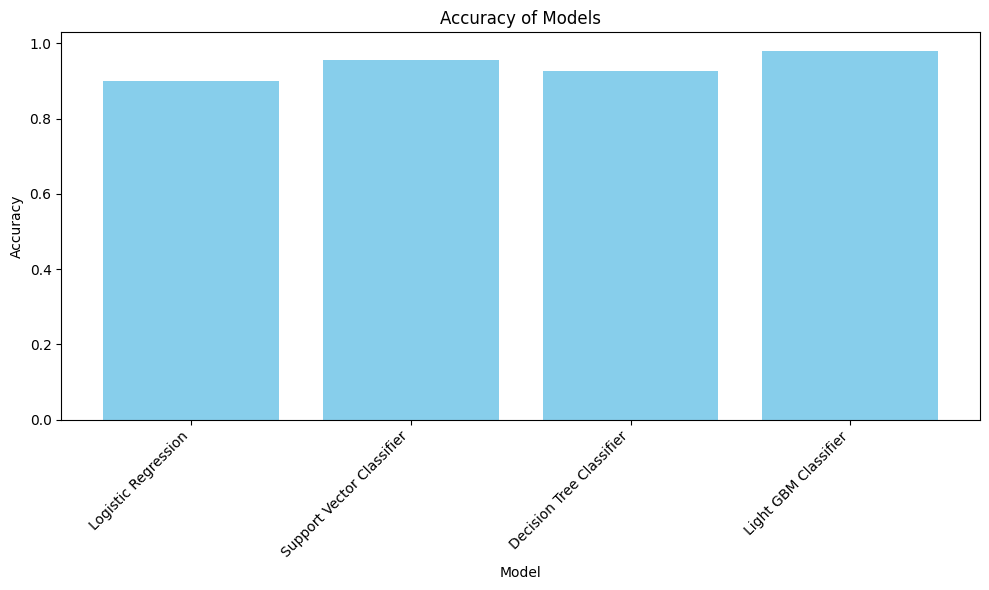

In [53]:
plt.figure(figsize=(10, 6))
plt.bar(results_df['Model'], results_df['Accuracy'], color='skyblue')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Accuracy of Models')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()




In [54]:
# Placeholder for feature importances
feature_importances = {}

# Extracting feature importances
for model_name, model in models.items():
    # Checking if model has feature_importances_ attribute (Decision Tree, LightGBM)
    if hasattr(model, 'feature_importances_'):
        feature_importances[model_name] = model.feature_importances_
    # For Logistic Regression, using the coefficients
    elif model_name == 'Logistic Regression' and hasattr(model, 'coef_'):
        feature_importances[model_name] = model.coef_[0]
    # Note: SVC does not provide a direct way for feature importance for non-linear kernels

# Displaying feature importances
for model_name, importances in feature_importances.items():
    print(f"\nFeature Importances for {model_name}:")
    for i, v in enumerate(importances):
        print(f'Feature: {i}, Score: {v:.5f}')


Feature Importances for Logistic Regression:
Feature: 0, Score: -0.86205
Feature: 1, Score: 0.12887
Feature: 2, Score: 0.28445
Feature: 3, Score: -0.13271
Feature: 4, Score: 0.05342
Feature: 5, Score: -0.20564
Feature: 6, Score: 0.50391
Feature: 7, Score: 0.36412
Feature: 8, Score: 0.11659
Feature: 9, Score: 0.58775
Feature: 10, Score: 0.06900
Feature: 11, Score: 0.35541
Feature: 12, Score: -0.47748
Feature: 13, Score: -0.23358
Feature: 14, Score: 0.22350
Feature: 15, Score: 0.12050
Feature: 16, Score: 0.11835
Feature: 17, Score: 0.39220
Feature: 18, Score: -0.12466
Feature: 19, Score: -0.16738
Feature: 20, Score: -0.73041
Feature: 21, Score: -0.04627
Feature: 22, Score: -2.39988
Feature: 23, Score: 0.07843
Feature: 24, Score: 0.02387
Feature: 25, Score: 0.42665
Feature: 26, Score: -0.24647
Feature: 27, Score: -0.02463
Feature: 28, Score: -0.15882
Feature: 29, Score: 0.77984
Feature: 30, Score: 0.03198
Feature: 31, Score: -0.07922
Feature: 32, Score: 0.32072
Feature: 33, Score: -0.166

In [55]:

feature_names = list(X.columns) 

# Placeholder for top 5 feature importances for each model
top_features = {}

# Extract and sort top 5 feature importances
for model_name, model in models.items():
    if hasattr(model, 'feature_importances_'):
        importances = pd.Series(model.feature_importances_, index=feature_names).sort_values(ascending=False)
        top_features[model_name] = importances.head(5)
    elif model_name == 'Logistic Regression' and hasattr(model, 'coef_'):
        importances = pd.Series(model.coef_[0], index=feature_names).abs().sort_values(ascending=False)
        top_features[model_name] = importances.head(5)

# Convert top features to DataFrame for table format
top_features_df_list = []

for model_name, features in top_features.items():
    df = features.reset_index()
    df.columns = ['Feature', 'Importance']
    df['Model'] = model_name
    top_features_df_list.append(df)

# Concatenate all model's top features into a single DataFrame
final_df = pd.concat(top_features_df_list, ignore_index=True)

# Pivot the DataFrame for better readability
pivot_df = final_df.pivot(index='Feature', columns='Model', values='Importance').fillna(0)

pivot_df


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Model,Decision Tree Classifier,Light GBM Classifier,Logistic Regression
Feature,,,
B_21,0.000000,0.0,1.051351
B_7,0.024575,0.0,0.000000
D_121,0.026880,0.0,0.000000
D_124,0.000000,94.0,0.000000
D_43,0.024060,0.0,0.000000
D_45,0.000000,89.0,0.000000
D_47,0.000000,86.0,0.000000
D_48,0.044555,0.0,0.000000
D_50,0.000000,0.0,2.399878


<IPython.core.display.Javascript object>

[LightGBM] [Info] Number of positive: 1516, number of negative: 4484
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 37367
[LightGBM] [Info] Number of data points in the train set: 6000, number of used features: 172
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.252667 -> initscore=-1.084440
[LightGBM] [Info] Start training from score -1.084440


<IPython.core.display.Javascript object>

[LightGBM] [Info] Number of positive: 1772, number of negative: 5228
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 37654
[LightGBM] [Info] Number of data points in the train set: 7000, number of used features: 172
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.253143 -> initscore=-1.081920
[LightGBM] [Info] Start training from score -1.081920


<IPython.core.display.Javascript object>

[LightGBM] [Info] Number of positive: 2043, number of negative: 5957
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 37822
[LightGBM] [Info] Number of data points in the train set: 8000, number of used features: 173
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.255375 -> initscore=-1.070148
[LightGBM] [Info] Start training from score -1.070148


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

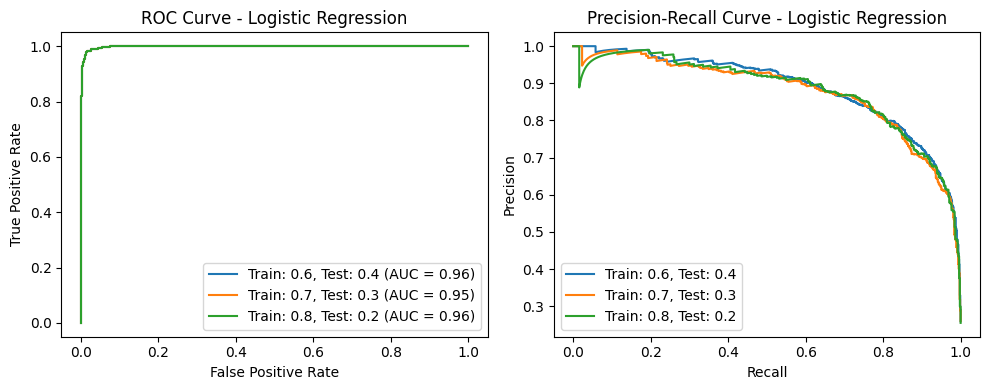

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

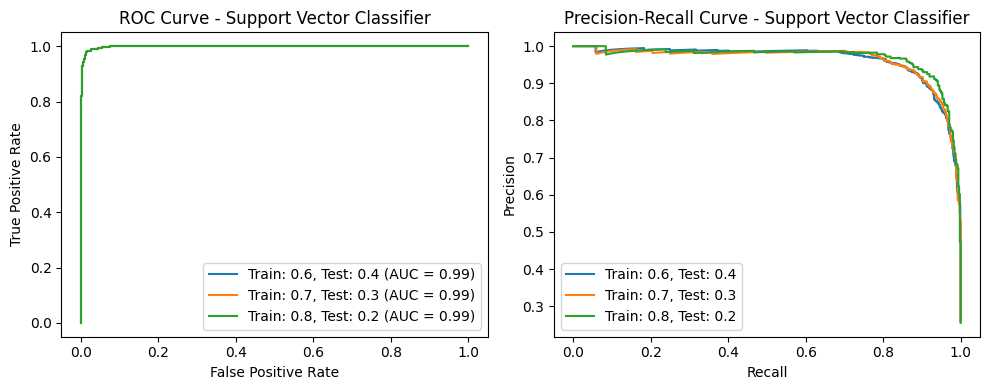

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

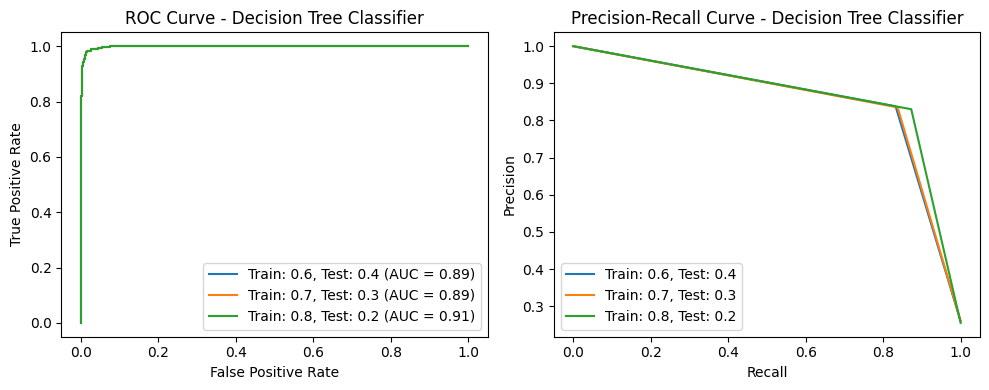

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

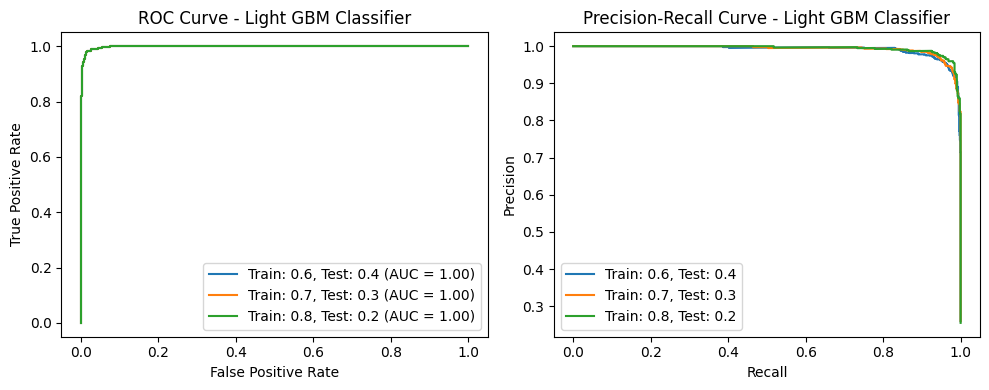

<IPython.core.display.Javascript object>

In [56]:
from sklearn.metrics import roc_curve, precision_recall_curve, auc, accuracy_score, precision_score, recall_score, f1_score
import numpy as np

# Define different train-test splits
train_test_splits = [(0.6, 0.4), (0.7, 0.3), (0.8, 0.2)]

# Define models
models = {
    'Logistic Regression': LogisticRegression(solver='liblinear',max_iter=1000),
    'Support Vector Classifier': SVC(probability=True),
    'Decision Tree Classifier': DecisionTreeClassifier(),
    'Light GBM Classifier': LGBMClassifier()
}

# Initialize lists to store results
roc_auc_results = {}
precision_recall_results = {}
metrics_results = []

# Iterate over train-test splits
for train_size, test_size in train_test_splits:
    x_train, x_test, y_train, y_test = train_test_split(X_s, y, train_size=train_size, test_size=test_size, random_state=20)
    
    # Iterate over models
    for model_name, model in models.items():
        # Train model
        model.fit(x_train, y_train)
        
        # Predict probabilities
        y_pred_proba = model.predict_proba(x_test)[:, 1]
        
        # ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
        roc_auc = auc(fpr, tpr)
        roc_auc_results[(train_size, test_size, model_name)] = roc_auc
        
        # Precision-recall curve
        precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
        precision_recall_results[(train_size, test_size, model_name)] = (precision, recall)
        
        # Metrics
        y_pred = model.predict(x_test)
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        metrics_results.append((train_size, test_size, model_name, accuracy, precision, recall, f1))

# Plot ROC curve and precision-recall curve for each model
# Plot ROC curve and precision-recall curve for each model
for model_name in models.keys():
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.title(f'ROC Curve - {model_name}')
    for (train_size, test_size, model_name_key), roc_auc in roc_auc_results.items():
        if model_name == model_name_key:
            plt.plot(fpr, tpr, label=f'Train: {train_size}, Test: {test_size} (AUC = {roc_auc:.2f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.title(f'Precision-Recall Curve - {model_name}')
    for (train_size, test_size, model_name_key), (precision, recall) in precision_recall_results.items():
        if model_name == model_name_key:
            plt.plot(recall, precision, label=f'Train: {train_size}, Test: {test_size}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.legend()
    
    plt.tight_layout()
    plt.show()


# Create DataFrame for metrics results
metrics_df = pd.DataFrame(metrics_results, columns=['Train Size', 'Test Size', 'Model', 'Accuracy', 'Precision', 'Recall', 'F1-Score'])



In [57]:
metrics_df

,Train Size,Test Size,Model,Accuracy,Precision,Recall,F1-Score
0,0.6,0.4,Logistic Regression,0.899250,0.823469,0.778206,0.800198
1,0.6,0.4,Support Vector Classifier,0.951750,0.928862,0.881389,0.904503
2,0.6,0.4,Decision Tree Classifier,0.914750,0.837864,0.832208,0.835027
3,0.6,0.4,Light GBM Classifier,0.977250,0.958333,0.953713,0.956017
4,0.7,0.3,Logistic Regression,0.899667,0.829670,0.773367,0.800530
5,0.7,0.3,Support Vector Classifier,0.952667,0.935880,0.878361,0.906209
6,0.7,0.3,Decision Tree Classifier,0.914667,0.835249,0.837388,0.836317
7,0.7,0.3,Light GBM Classifier,0.977667,0.970976,0.942382,0.956465
8,0.8,0.2,Logistic Regression,0.900500,0.821946,0.778431,0.799597
9,0.8,0.2,Support Vector Classifier,0.956500,0.947146,0.878431,0.911495
